In [1]:
#Clone githun repository
!git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 67341, done.
remote: Total 67341 (delta 0), reused 0 (delta 0), pack-reused 67341
Receiving objects: 100% (67341/67341), 576.21 MiB | 28.32 MiB/s, done.
Resolving deltas: 100% (47265/47265), done.


In [2]:
#Upgrade pip package
!pip install --upgrade pip

     |████████████████████████████████| 1.7 MB 30.2 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3


In [3]:
%%bash
cd models/research
# Compile protos.
protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
cp object_detection/packages/tf2/setup.py .
python -m pip install --use-feature=2020-resolver .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
INFO: pip is looking at multiple versions of requests to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of pyyaml to determine which version is compatible with other r

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [4]:
#Check if Object Detection API is installed
!pip list | grep object-detection

object-detection              0.1


#### 2. Prepare Environment

In [5]:
#Mount Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# RegEx
import re

# For saving model train history info to disk
import pickle

# Pandas is used for data manipulation and analysis
import pandas as pd 
pd.set_option('display.max_colwidth', 200)

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays 
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
from matplotlib import pyplot

# CV2 for image processing and filter applying.
import cv2

# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns
import tensorflow 

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import save_img
print(tensorflow.__version__)

2.6.2


In [7]:
#Create a folder for your project e.g in this case, detection. You can choose any name for the folder 
!mkdir detection

In [8]:
#Go to the project folder
%cd "/content/detection"

#Create a folder for your project e.g in this case, detection. You can choose any name for the folder 
!mkdir JPEGImages

/content/detection


In [9]:
#Copy xml_to_csv.py from drive to current directory. Change gdrive folder if you have saved script in some other folder
!cp '/content/drive/MyDrive/GL- AIML/ACV Project/Dataset- Images.npy' . 
!cp '/content/drive/MyDrive/GL- AIML/ACV Project/Project/generate_tfrecord.py' . 

In [10]:
#Copy ssd_mobilenet_v2_modified.config from drive to current directory. 
#Change gdrive folder if you have saved script in some other folder
!cp '/content/drive/MyDrive/GL- AIML/ACV Project/Project/ssd_mobilenet_v2_modified.config' . 

In [11]:
#Go to the project folder
%cd /content/detection

/content/detection


#### 3. Prepare dataset

In [12]:
import numpy as np
import tensorflow as tf

In [13]:
#Copy the data from Google drive
data = np.load("/content/drive/MyDrive/GL- AIML/ACV Project/Dataset- Images.npy", allow_pickle=True)

In [14]:
#Number of examples
data.shape

(409, 2)

In [15]:
data[272][0].shape

(350, 650)

In [16]:
data[272][0] = data[272][0].reshape((data[272][0].shape[0], data[272][0].shape[1], 1))

data[272][0].shape

(350, 650, 1)

Generate CSV file from all XML files using copied script. The script requires two parameters
1. -i <xml_files_folder_name> : indicating XML files are stored
2. -o <output_file_path> : indicating what name should be given to CSV output file and where it should be stored.

In [17]:
## Build a pandas dataset
df_combined = pd.DataFrame(columns=['filename','width','height','class','xmin','ymin','xmax','ymax','label'])

# Iterate thru all images in zip and populate the df.
for i in range(data.shape[0]):
    image_name = 'sample-img-' + str(i).zfill(3) + '.jpg'
    img_path = "JPEGImages/" + image_name   
    
    # save the image with a new filename
    image = tf.keras.preprocessing.image.array_to_img(data[i][0])
    rgb_im = image.convert('RGB')
    img_array = tf.keras.preprocessing.image.img_to_array(rgb_im)
    save_img(img_path, img_array)

    # Storing bounded boxes in dataframe
    for ei in range(len(data[i][1])):
        img_height = data[i][1][ei]['imageHeight']
        img_width = data[i][1][ei]['imageWidth']
        x0 = data[i][1][ei]['points'][0]['x'] * data[i][1][ei]['imageWidth']
        y0 = data[i][1][ei]['points'][0]['y'] * data[i][1][ei]['imageHeight']
        x1 = data[i][1][ei]['points'][1]['x'] * data[i][1][ei]['imageWidth']
        y1 = data[i][1][ei]['points'][1]['y'] * data[i][1][ei]['imageHeight']

        df_combined.loc[df_combined.shape[0]] = [image_name, img_width, img_height, "face", x0, y0, x1, y1, 0]

In [18]:
df_combined.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,sample-img-000.jpg,650,333,face,56.000000,102.000000,112.000000,151.000000,0
1,sample-img-000.jpg,650,333,face,379.000000,97.000000,428.000000,156.000000,0
2,sample-img-001.jpg,1280,697,face,902.795233,162.125249,984.615385,252.194831,0
3,sample-img-002.jpg,460,240,face,216.000000,12.000000,279.000000,80.000000,0
4,sample-img-002.jpg,460,240,face,289.000000,2.000000,343.000000,74.000000,0


In [19]:
#How many faces across all images
df_combined.shape

(1132, 9)

In [20]:
#List of labels
df_combined['class'].unique()

array(['face'], dtype=object)

In [21]:
#Number of labels
len(df_combined['class'].unique())

1

In [22]:
#Label Encode class and add a 'label' column to the dataframe
df_combined['label'] = 1
df_combined.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,sample-img-000.jpg,650,333,face,56.000000,102.000000,112.000000,151.000000,1
1,sample-img-000.jpg,650,333,face,379.000000,97.000000,428.000000,156.000000,1
2,sample-img-001.jpg,1280,697,face,902.795233,162.125249,984.615385,252.194831,1
3,sample-img-002.jpg,460,240,face,216.000000,12.000000,279.000000,80.000000,1
4,sample-img-002.jpg,460,240,face,289.000000,2.000000,343.000000,74.000000,1


In [23]:
#Create a dictionary of Label and Class. This will be useful for building our second input to Model training
label_class_dict = dict(zip(df_combined['label'], df_combined['class']))
print(label_class_dict)

{1: 'face'}


**Split data between training and test**

First we have to split images between training and test. Then we can use that information to split dataframe between training and test. This will make sure objects from same image are not split between training and test.

In [24]:
#Get information on all images
all_classes = df_combined['filename'].unique()
all_classes.shape

(409,)

In [25]:
#Split images between training and test
#80% of the data will be used for training
mask = np.random.rand(all_classes.shape[0]) < 0.8

#Get Training and Test images
train_images = all_classes[mask]
test_images = all_classes[~mask] 

In [26]:
#Check number of images in training and test
train_images.shape, test_images.shape

((332,), (77,))

In [27]:
#Split dataframe between training and test
train_df = df_combined[df_combined['filename'].isin(train_images)]
test_df = df_combined[df_combined['filename'].isin(test_images)]

In [28]:
train_df.shape, test_df.shape

((916, 9), (216, 9))

In [29]:
df_combined.xmax = df_combined.xmax.astype(int)
df_combined.ymax = df_combined.ymax.astype(int)
df_combined.xmin = df_combined.xmin.astype(int)
df_combined.ymin = df_combined.ymin.astype(int)


Number of objects 1


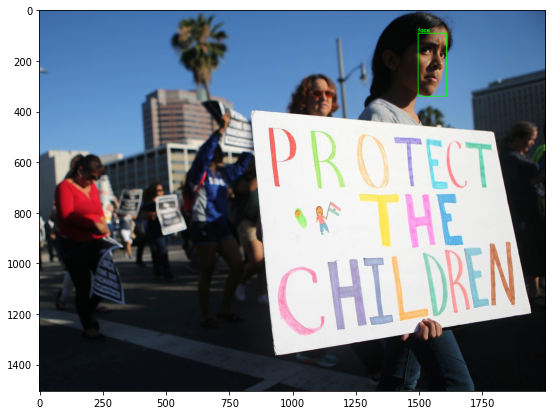

In [30]:
#Pickup a random image number
img_num = np.random.randint(0, df_combined.shape[0])
img_path = '/content/detection/JPEGImages'

#Read the image
img_file = df_combined.loc[img_num,'filename']
img = cv2.imread(img_path + '/' + img_file)

#Find all rows which have same file name
rows_with_file = df_combined[df_combined['filename'] == img_file].index.tolist()

#Draw rectangle(s) as per bounding box information
print('Number of objects', len(rows_with_file))
for i in rows_with_file:

    #Get bounding box
    xmin, ymin, xmax, ymax = df_combined.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']]
    #Get Label
    label = df_combined.loc[i, 'class']
    #Add bounding box
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0,255,0), 2)
    #Add text
    cv2.putText(img,label,(xmin, ymin-5),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.figure(figsize=(10,7))
plt.imshow(img)
plt.show()

Save training and test data as csv

In [31]:
train_df.to_csv('train.csv', index=False)
test_df.to_csv('test.csv', index=False)

In [32]:
#We should have training and test csv files in current directory
!ls -l

total 1325204
-rw------- 1 root root 1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root root       4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Nov 21 08:56  JPEGImages
-rw------- 1 root root       4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root      16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root root      74162 Nov 21 08:56  train.csv


#### Generate tfrecord from CSV
Tensorflow object detection API requires data in tfrecord format. This can be done using generate_tfrecord.py file.

The script file requires 3 inputs

1. --csv_input=<csv_file_path> : where is csv file located which was prepared in previous step
2. --img_path=<images_folder> : where are the actual images stored
3. --output_path=<output_file_path> : where the script can save the generated tfrecord file and what should be file name.

We will run script for training and test csv separately to create two tfrecord files.

In [33]:
#generate tfrecord for training data
!python generate_tfrecord.py --csv_input=train.csv  --img_path={img_path} --output_path=train.tfrecord

2021-11-21 08:56:39.420619: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-11-21 08:56:39.420682: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (bd171f950e86): /proc/driver/nvidia/version does not exist
Successfully created the TFRecords: /content/detection/train.tfrecord


In [34]:
#generate tfrecord for test data
!python generate_tfrecord.py --csv_input=test.csv  --img_path={img_path} --output_path=test.tfrecord

2021-11-21 08:56:43.410432: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-11-21 08:56:43.410494: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (bd171f950e86): /proc/driver/nvidia/version does not exist
Successfully created the TFRecords: /content/detection/test.tfrecord


In [35]:
#train.record and test.record files should be available now
!ls -l

total 1374684
-rw------- 1 root root 1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root root       4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Nov 21 08:56  JPEGImages
-rw------- 1 root root       4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root      16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root root    8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root root      74162 Nov 21 08:56  train.csv
-rw-r--r-- 1 root root   42047949 Nov 21 08:56  train.tfrecord


#### 5. Create Label Mapping File

In [36]:
#Dict which was created earlier will be used for building Label Mapping file
label_class_dict

{1: 'face'}

In [37]:
#Build a pbtxt label file using label and class name
#This is required by Object detection API
#You can prepare it manually as well.

pbtxt_file_txt = ''
for label in sorted(label_class_dict.keys()):
    
    pbtxt_file_txt += "item {\n  id: " + str(label) + "\n  name: '" +  label_class_dict[label] + "'\n}\n\n"

with open('label_map.txt','w') as pbfile:
    pbfile.write(pbtxt_file_txt)

In [38]:
!ls -l

total 1374688
-rw------- 1 root root 1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root root       4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root root         33 Nov 21 08:56  label_map.txt
-rw------- 1 root root       4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root      16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root root    8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root root      74162 Nov 21 08:56  train.csv
-rw-r--r-- 1 root root   42047949 Nov 21 08:56  train.tfrecord


In [39]:
#Review the file content
!cat label_map.txt

item {
  id: 1
  name: 'face'
}



#### 6. Download a pre-trained model

A list of pre-trained models is available at [TensorFlow model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md). We will use 'ssd_mobilenet_v1_coco' model for transfer learning.

In [40]:
#Download the model from zoo
!wget -q http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
##!wget -q http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet50_coco_2018_01_28.tar.gz

In [41]:
#Extract tar file content
!tar -xf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

##!tar -xf faster_rcnn_resnet50_coco_2018_01_28.tar.gz

In [42]:
!ls -l

total 1419656
-rw------- 1 root   root  1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root   root        4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root   root          33 Nov 21 08:56  label_map.txt
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root        4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root       16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root   root     8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root   root       74162 Nov 21 08:56  train.csv
-rw-r--r-- 1 root   root    42047949 Nov 21 08:56  train.tfrecord


#### 7. Prepare Training configuration file

1. Change num_classes parameter to 20 (as we have 20 categories in pascal voc dataset)
2. For 'train_input_reader' change 'input_path' to filepath of train.record file.
3. For 'train_input_reader' change 'label_map_path' to filepath of pascal_voc.pbtxt file.
4. Repeat above two steps for 'eval_input_reader'.
5. Change fine_tune_checkpoint to filepath where pre-trained model.ckpt file is available e.g ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint/ckpt-0
6. Change 'batch_size' accordingly to available memory.
7. Change 'num_steps' to indicate how long the training will done e.g. 200000. For demo purpose, we are keeping it to 20 so that we can finish training quickly.

Set Config file name

In [43]:
config_file = 'ssd_mobilenet_v2_modified.config'
## config_file = 'faster_rcnn_resnet50_coco_2018_01_28/pipeline.config'

#### 8. Training the model

In [44]:
#Copy training file from 'models/research/object_detection' folder to current folder
!cp /content/models/research/object_detection/model_main_tf2.py .

In [45]:
!ls -l

total 1419664
-rw------- 1 root   root  1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root   root        4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root   root          33 Nov 21 08:56  label_map.txt
-rw-r--r-- 1 root   root        4937 Nov 21 08:56  model_main_tf2.py
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root        4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root       16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root   root     8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root   root       74162 Nov 21 08:56  train.csv
-rw-r--r-- 1 root   root    42047949 Nov 21 08:56  train.tfrecord


Start training 

- Please note that Object detection take long time to train. The training may take few days if run on single GPU machine (depending on num of steps indicated). Try to keep training the model till loss comes close to 1 (or goes below 1). The script takes 3 inputs

1. --model_dir=<folder_name> : where model will be saved periodically as training progresses
2. --pipeline_config_path=<config_file_path> :where is model training configuration file located.

In [46]:
#Create a training folder to store model checkpoints/snapshots as training progresses
!mkdir training

In [47]:
#Check training folder
!ls -l training

total 0


In [48]:
print(tensorflow.__version__)

2.6.2


Start Tensorboard

In [49]:
## !nvidia-smi

In [50]:
## !cat /usr/include/cudnn.h | grep CUDNN_MAJOR -A 2

In [51]:
 import torch

print("PyTorch version: ")
print(torch.__version__)
print("CUDA Version: ")
print(torch.version.cuda)
print("cuDNN version is: ")
print(torch.backends.cudnn.version())

PyTorch version: 
1.10.0+cu111
CUDA Version: 
11.1
cuDNN version is: 
8005


In [52]:
##!pip install --upgrade tensorflow

In [53]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [54]:
import platform
platform.platform()

'Linux-5.4.104+-x86_64-with-Ubuntu-18.04-bionic'

In [55]:
!dpkg -i "/content/drive/MyDrive/GL- AIML/ACV Project/Project/Copy of libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb"

(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack .../Copy of libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+cuda11.2) over (8.0.5.39-1+cuda11.1) ...
Setting up libcudnn8 (8.1.0.77-1+cuda11.2) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link



In [56]:
#!ls -l /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libcudnn.so.6*
#!ls -l /usr/local/lib/x86_64-linux-gnu/libcudnn.so.6*
!ls -l

total 1419668
-rw------- 1 root   root  1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw------- 1 root   root        4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root   root          33 Nov 21 08:56  label_map.txt
-rw-r--r-- 1 root   root        4937 Nov 21 08:56  model_main_tf2.py
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root        4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root       16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root   root     8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root   root       74162 Nov 21 08:56  train.csv
drwxr-xr-x 2 root   root        4096 Nov 21 08:56  training
-rw-r--r-- 1 root   root    42047949 Nov 21 08:56  train.tfrecord


In [57]:
##!pip install --pre torch torchvision -f https://download.pytorch.org/whl/nightly/cu102/torch_nightly.html -U

In [58]:
##import torch
##torch.cuda.is_available()

In [59]:
%load_ext tensorboard

In [60]:
import tensorflow as tf
tf.test.gpu_device_name()
# Standard output is '/device:GPU:0'

''

In [61]:
%tensorboard --logdir training

<IPython.core.display.Javascript object>

In [62]:
#start training
!python model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_every_n=100 --alsologtostderr

2021-11-21 08:58:23.881325: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-11-21 08:58:23.881383: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (bd171f950e86): /proc/driver/nvidia/version does not exist
2021-11-21 08:58:23.885084: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
W1121 08:58:23.898126 140203063977856 cross_device_ops.py:1387] There are non-GPU devices in `tf.distribute.Strategy`, not using nccl allreduce.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I1121 08:58:23.955134 140203063977856 mirrored

#### 9. Export trained model

From the saved model checkpoints, we will create a frozen trained model. Frozen here means to remove model nodes which are no longer needed in prediction. This reduces model size.

In [73]:
%cd /content/detection

/content/detection


In [64]:
#Copy export_inference_graph.py file from models/research/object_detection to current directory
!cp /content/models/research/object_detection/exporter_main_v2.py .

In [65]:
!ls -l

total 1419676
-rw------- 1 root   root  1356868279 Nov 21 08:55 'Dataset- Images.npy'
-rw-r--r-- 1 root   root        7605 Nov 21 09:29  exporter_main_v2.py
-rw------- 1 root   root        4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root   root          33 Nov 21 08:56  label_map.txt
-rw-r--r-- 1 root   root        4937 Nov 21 08:56  model_main_tf2.py
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root        4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root       16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root   root     8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root   root       74162 Nov 21 08:56  train.csv
drwxr-xr-x 3 root   root        4096 Nov 21 09:15  training
-rw-r--r-- 1 root   root    42047949 Nov 21 08:56  train.tfr

The export_inference_graph.py script file requires the following input:

1. --input_type <input_node_name> : This will be used during prediction to set model input
2. --pipeline_config_path <model_training_config_file_path> : where is model training config file located.
3. --trained_checkpoint_prefix <file_path__model_checkpoint> : Which checkpoint should be used to create final model.
4. --output_directory <frozen_model_directory> : where should the frozen model created by script should be stored.

In [66]:
#Provide input name, config file location, training folder
!python exporter_main_v2.py --input_type "image_tensor" --pipeline_config_path {config_file} --trained_checkpoint_dir training/ --output_directory detection_model

2021-11-21 09:29:49.430149: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-11-21 09:29:49.430214: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (bd171f950e86): /proc/driver/nvidia/version does not exist
2021-11-21 09:29:49.440812: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W1121 09:29:49.746590 140538122893184 deprecation.py:616]

In [67]:
#Check if model is saved in current directory
!ls -l detection_model

total 16
drwxr-xr-x 2 root root 4096 Nov 21 09:30 checkpoint
-rw-r--r-- 1 root root 4188 Nov 21 09:30 pipeline.config
drwxr-xr-x 4 root root 4096 Nov 21 09:30 saved_model


#### Model Prediction

Load Saved model

In [68]:
saved_model_path = 'detection_model/saved_model'
model = tf.saved_model.load(saved_model_path)

Function to get model prediction

In [69]:
#Function to get predictions from a Detection model
def detector_prediction(image_file, img_array=None, confidence_threshold=0.5):

    """
    image_file: File path of the image for which prediction needs to be done
    img_array: only considered if image_file is not specified
    confidence_threshold: Minimum confidence/probability for prediction to be considered
    """
    #Load image
    if(image_file):
        img = tf.keras.preprocessing.image.load_img(image_file)
        img_array = tf.keras.preprocessing.image.img_to_array(img).astype('uint8')
    
    #Make it a batch of one example
    img_array = tf.expand_dims(img_array, axis=0)

    #Prediction
    output = model(img_array) #get list of tensors discussed above as output
    #print(output)
    detection_scores = output['detection_scores'].numpy()[0] #get detection scores
    detection_classes = output['detection_classes'].numpy()[0]
    detection_boxes = output['detection_boxes'].numpy()[0]

    #Select predictions for which probability is higher than confidence_threshold
    selected_predictions = detection_scores >= confidence_threshold

    selected_prediction_scores = detection_scores[selected_predictions]
    selected_prediction_classes = detection_classes[selected_predictions]
    selected_prediction_boxes = detection_boxes[selected_predictions]

    #De-normalize box co-ordinates (multiply x-coordinates by image width and y-coords by image height)
    img_h, img_w = img_array.shape[1:3]

    for i in range(selected_prediction_boxes.shape[0]):
        
        selected_prediction_boxes[i,0] *= img_h #ymin * img_w
        selected_prediction_boxes[i,1] *= img_w #xmin * img_h
        selected_prediction_boxes[i,2] *= img_h #ymax * img_w
        selected_prediction_boxes[i,3] *= img_w #xmax * img_h

    #Make all co-ordinates as integer
    selected_prediction_boxes= selected_prediction_boxes.astype(int)

    #Convert class indexes to actual class labels
    predicted_classes = []
    for i in range(selected_prediction_classes.shape[0]):
        predicted_classes.append(label_class_dict[int(selected_prediction_classes[i])])

    #Number of predictions
    selected_num_predictions = selected_prediction_boxes.shape[0]

    return {'Total Predictions': selected_num_predictions,
            'Scores': selected_prediction_scores, 
            'Classes': predicted_classes, 
            'Box coordinates': selected_prediction_boxes}

Copy an image to predict on

In [74]:
!cp '/content/drive/MyDrive/GL- AIML/ACV Project/Prediction_Image.jpeg' .

In [71]:
!ls -l

total 1419680
-rw------- 1 root   root  1356868279 Nov 21 08:55 'Dataset- Images.npy'
drwxr-xr-x 4 root   root        4096 Nov 21 09:30  detection_model
-rw-r--r-- 1 root   root        7605 Nov 21 09:29  exporter_main_v2.py
-rw------- 1 root   root        4465 Nov 21 08:55  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Nov 21 08:56  JPEGImages
-rw-r--r-- 1 root   root          33 Nov 21 08:56  label_map.txt
-rw-r--r-- 1 root   root        4937 Nov 21 08:56  model_main_tf2.py
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw------- 1 root   root        4362 Nov 21 08:55  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root       16232 Nov 21 08:56  test.csv
-rw-r--r-- 1 root   root     8614109 Nov 21 08:56  test.tfrecord
-rw-r--r-- 1 root   root       74162 Nov 21 08:56  train.csv
drwxr-xr-x 3 root   root        4096 Nov 21 09:15  tr

In [75]:
#Model output
detector_prediction('Prediction_Image.jpeg', confidence_threshold=0.5)

{'Box coordinates': array([[254, 191, 387, 274],
        [ 15, 251, 142, 337],
        [ 49, 255, 126, 300]]),
 'Classes': ['face', 'face', 'face'],
 'Scores': array([0.62227017, 0.56834483, 0.56703764], dtype=float32),
 'Total Predictions': 3}

Visualize model output

In [76]:
def visualize_output(image_file, confidence_threshold=0.5):

    #Call model prediction function above
    output = detector_prediction(image_file, confidence_threshold=confidence_threshold)

    #Read image
    img = cv2.imread(image_file)

    #Draw rectangle for predicted boxes, also add predicted classes
    for i in range(output['Box coordinates'].shape[0]):

        box = output['Box coordinates'][i]
        
        #Draw rectangle - (ymin, xmin, ymax, xmax)
        img = cv2.rectangle(img, (box[1], box[0]), (box[3], box[2]), (0,255,0), 2)
        
        #Add Label - Class name and confidence level
        label = output['Classes'][i] + ': ' + str(round(output['Scores'][i],2))
        img = cv2.putText(img, label, (box[1], box[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    
    #Conver BGR image to RGB to use with Matplotlib
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #Display image
    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.show()

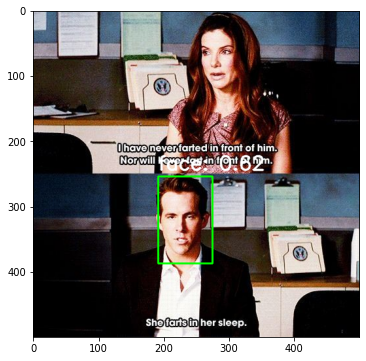

In [77]:
#Visualize on image
visualize_output('Prediction_Image.jpeg', confidence_threshold=0.6)

#### Move the trained model to Google Drive

Save label dictionary as well for model prediction

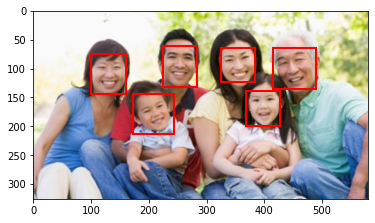

In [78]:
index = 4

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(data[index][0])

for i in range(len(data[index][1])):
    x0 = data[index][1][i]['points'][0]['x'] * data[index][1][i]['imageWidth']
    y0 = data[index][1][i]['points'][0]['y'] * data[index][1][i]['imageHeight']
    x1 = data[index][1][i]['points'][1]['x'] * data[index][1][i]['imageWidth']
    y1 = data[index][1][i]['points'][1]['y'] * data[index][1][i]['imageHeight']
    
    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), (x1 - x0) , (y1 - y0) , linewidth=2, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)

plt.show()

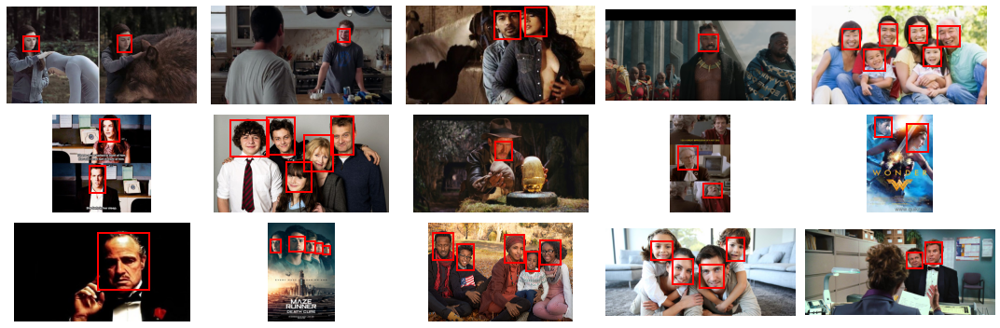

In [79]:
# Set plot figure size.
fig,ax=plt.subplots(3,5, figsize=(15,5))

# Iterate and display first 30 images along with their labels.
for i in range(15):
    image = tf.keras.preprocessing.image.array_to_img(data[i][0])
    ax[int((i/5)),(i%5)].imshow(image)
    
    for ei in range(len(data[i][1])):
        x0 = data[i][1][ei]['points'][0]['x'] * data[i][1][ei]['imageWidth']
        y0 = data[i][1][ei]['points'][0]['y'] * data[i][1][ei]['imageHeight']
        x1 = data[i][1][ei]['points'][1]['x'] * data[i][1][ei]['imageWidth']
        y1 = data[i][1][ei]['points'][1]['y'] * data[i][1][ei]['imageHeight']
    
        # Create a Rectangle patch
        rect = patches.Rectangle((x0, y0), (x1 - x0) , (y1 - y0) , linewidth=2, edgecolor='r', facecolor='none')
        #rect = patches.Rectangle((100, 100), (20) , (20) , linewidth=2, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax[int((i/5)),(i%5)].add_patch(rect)
    ax[int((i/5)),(i%5)].axis('off')
        
plt.tight_layout()

#### Split Data

PART 2 - Creating Labels

In [80]:
import cv2
import os
from zipfile import ZipFile

In [82]:
zip_file =  ZipFile('/content/drive/MyDrive/GL- AIML/ACV Project/Part 2 - training images.zip', 'r')
all_images = zip_file.namelist()

In [84]:
## Build a pandas dataset
df_annotations = pd.DataFrame(columns=['image_name', 'total_faces', 'x', 'y', 'w', 'h'])

# Load the cascade
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/GL- AIML/ACV Project/Project/haarcascade_frontalface_default.xml')

# Iterate thru all images in zip and populate the df.
for i in range(len(all_images)):
    image_name = all_images[i]
    
    data = zip_file.read(image_name)
    img = cv2.imdecode(np.frombuffer(data, np.uint8), 1)
    
    # Convert into grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=3,
        minSize=(50, 50),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    
    total_faces = 0
    
    # Storing bounded boxes in dataframe
    if(len(faces) > 0):
        total_faces = len(faces)
        for (x, y, w, h) in faces:
            df_annotations.loc[df_annotations.shape[0]] = [image_name, total_faces, x, y, w, h]
    else:
        df_annotations.loc[df_annotations.shape[0]] = [image_name, total_faces, 0, 0, 0, 0]

In [85]:
# Pickle dataset.
df_annotations.to_csv('df_annotations.csv',index=False)

In [86]:
df_annotations.total_faces.value_counts().sort_index()

0    136
1    864
2    156
3     36
4      4
Name: total_faces, dtype: int64

In [87]:
df_annotations[df_annotations['image_name']=='training_images/real_00980.jpg']
#training_images/real_00980.jpg	

,image_name,total_faces,x,y,w,h
32,training_images/real_00980.jpg,2,276,110,64,64
33,training_images/real_00980.jpg,2,22,504,75,75


In [88]:
df_annotations.iloc[2].x

68

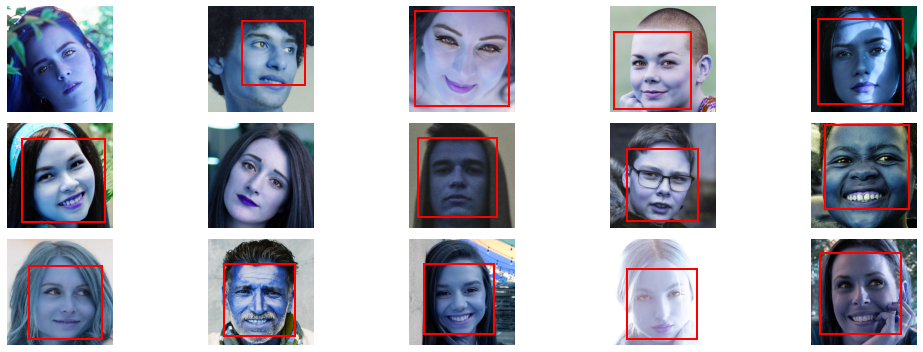

In [89]:
# Set plot figure size.
fig,ax=plt.subplots(3,5, figsize=(15,5))
startIndex = 45

# Iterate and display first 30 images along with their labels.
for i in range(15):
    index = startIndex + i
    image_name = all_images[index]
    data = zip_file.read(image_name)
    
    image = cv2.imdecode(np.frombuffer(data, np.uint8), 1)
    #image = tf.keras.preprocessing.image.array_to_img(np.frombuffer(data, np.uint8))
    
    ax[int((i/5)),(i%5)].imshow(image)
    
    annotations = df_annotations[df_annotations['image_name']==image_name]
    
    for mask in range(annotations.shape[0]):
        x = annotations.iloc[mask].x
        y = annotations.iloc[mask].y
        w = annotations.iloc[mask].w
        h = annotations.iloc[mask].h
    
        # Create a Rectangle patch
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        
        # Add the patch to the Axes
        ax[int((i/5)),(i%5)].add_patch(rect)
    ax[int((i/5)),(i%5)].axis('off')
        
plt.tight_layout()

Again, the above example highlights the primary limitation of Haar cascades. While they are fast, you pay the price via:

False-positive detections
Less accuracy (as opposed to HOG + Linear SVM and deep learning-based face detectors)
Manual parameter tuning
That said, in resource-constrained environments, Haar cascade face detection works quite fast.